## Introduction

This notebook walls through training a decision tree on a data set containing the properites of different benign and malignant cells. [The data can be found here](https://www.kaggle.com/uciml/breast-cancer-wisconsin-data). Unlike the mushroom data this is a real dataset. However it is already mostly clean so it's ready to jsut jump in. 

The goal will be to train a decision tree capabale of determining if a cell is benign or malignant.

## Set Up
The first step is to load the main modules we will be using. 
- Pandas is a library providing high-performance, easy-to-use data structures and data analysis tools for Python
- NumPy is a library for the Python programming language, adding support for large, multi-dimensional arrays and matrices, along with a large collection of high-level mathematical functions to operate on these arrays.
- matplotlob is a library used for plotting
- Seaborn is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics. 

In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


The next piece of code is just copy pasted from [scikit_learn]( https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html) to make nice confusion matrix plots.


In [102]:
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels

def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


## Load and View data

First we load in the data using pandas. [See here for documentation (scroll to bottom to see example)](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.read_csv.html).

In [103]:
"""

Your code goes here 

"""

Next we want to have a first look at how the data looks. [See here for documentation](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.head.html)

In [ ]:
"""

Your code goes here 

"""

## Pre Processing
scikit learn requires that these leters be converted to integers for their implimentation of decision tress so we'll double check for nans and if all values are numeric

In [ ]:
"""

Your code goes here 

"""

----
[Drop some useless columns](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.drop.html) and change any [categorical columns to numerical](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelEncoder.html)

In [108]:
"""

Your code goes here 

"""

We can see that all our values are now numeric. 

The next code block just does some plotting so we can see if edible mushrooms have and distinguishing characteristics from poisonous mushrooms. [See here for the seaborn documentation](https://seaborn.pydata.org/generated/seaborn.pairplot.html)

C:\Users\Mark\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\Mark\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


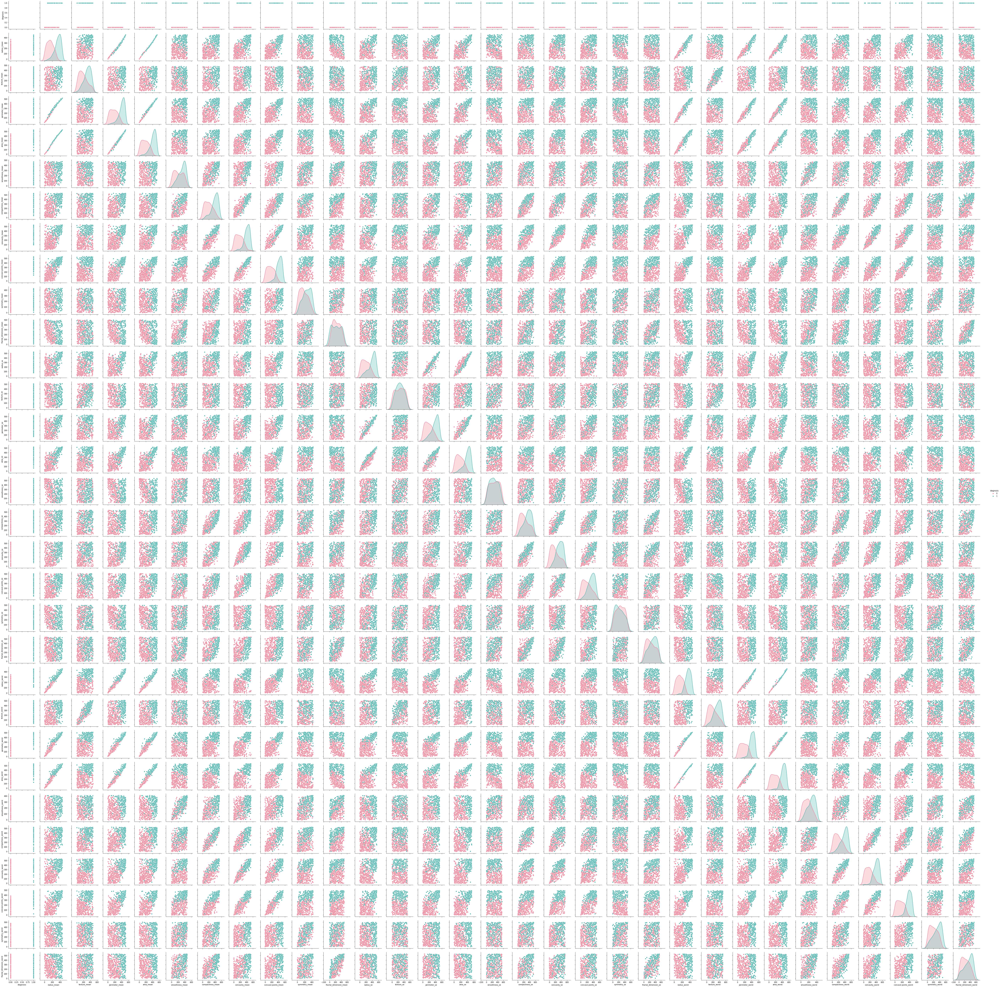

In [26]:
g = sns.pairplot(data, hue="diagnosis", palette="husl")

## Train Test Split

Next we split the data into training and test sets. [See here for documentation](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html)

In [27]:
"""

Your code goes here 

"""

## Model Fitting

Now we fit a model to the training data. We will use a decision tree. [See section 1.10.1 for how to do this with scikit learn](https://scikit-learn.org/stable/modules/tree.html).

In [111]:
"""

Your code goes here 

"""

### Visualise the model

This code block creates a map of our decision tree [See section 1.10.1 for how to do this with graphviz](https://scikit-learn.org/stable/modules/tree.html).

This will tell us what the decision is at each node, how many samples reach the node, how many of each class reach the node, which class has more samples and the color indeicates which class has more samples. Blue represents malignant and orange represents benign. The closer to white the more balanced the sample at that node is. 

In [ ]:
"""

Your code goes here 

"""

## Feature Importance

Decision trees naturally provide a measure of feature importance. This block of code is for finding the most important features and plotting the feature importance. 

[Here is a random stack overflow on how to do this](https://stackoverflow.com/questions/44101458/random-forest-feature-importance-chart-using-python) There might be better ones


In [ ]:
"""

Your code goes here 

"""

## Evaluate

How well did we do. How many false positives/negatives do we get in the teset data set. We porbably want to minimise false negatives the most. 

Evaluate the model here. Resources:

- [confusion matrix](https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html)
- [scikit learn](https://scikit-learn.org/stable/modules/model_evaluation.html)

In [ ]:
"""

Your code goes here 

"""

## Overfitting

Decision trees can easily overfit and just memorise your training set. We can check if that is what happened here by plugging the training data into the confusion matrix. 

In [ ]:
"""

Your code goes here 

"""

## Can we Do better

A random forest helps preven offer fitting by training lots of small trees on different subsets of the data. The trees than vote on the class of an individual observation. 

[See here for information on how to run a random forest classifier](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html)

In [130]:
"""

Your code goes here 

"""